# Quick look at reprocessing done by Ken for DM-29373

The new rerun was done with `exposure IN (11690, 11692, 29324, 29326, 1202, 1204, 23692, 23694) AND detector in (49, 50)`

In [1]:
%matplotlib notebook

import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import importlib
import pandas as pd
from types import SimpleNamespace

from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.visualization import (ZScaleInterval, SqrtStretch, ImageNormalize)

import lsst.geom
import lsst.daf.butler as dafButler
from lsst.ap.association import UnpackApdbFlags, MapDiaSourceConfig
from lsst.obs.decam import DarkEnergyCamera
from lsst.pipe.base import Struct

In [2]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import apdbPlots as pla
import plotLightcurve as plc
import coaddAnalysis as coa

In [ ]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(pla)
importlib.reload(plc)
importlib.reload(coa)

In [3]:
repo = '/datasets/hsc/gen3repo/rc2w50_ssw02'
butler = dafButler.Butler(repo)

In [12]:
reference = SimpleNamespace(collection = 'u/kherner/ApPipe_default_middleSeeing',
                            apdb = '/project/kherner/diffim_sprint_2021-02/bps_testing/bps_default_middle.db')
convolveSci_noDecorr_best = SimpleNamespace(collection = 'u/kherner/ApPipe_convolveSci_noDecorr_bestSeeing',
                                            apdb = '/project/kherner/diffim_sprint_2021-02/bps_testing/bps_convolveSci_noDecorr_best.db')
DM29373_best = SimpleNamespace(collection = 'u/kherner/ApPipe_convolveSci_noDecorr_bestSeeing_DM-29373_localdb2',
                               apdb = '/project/kherner/diffim_sprint_2021-02/bps_testing/bps_convolveSci_noDecorr_debug.db')

In [13]:
all_runs = [reference, convolveSci_noDecorr_best, DM29373_best]

In [14]:
badFlagList = ['base_PixelFlags_flag_bad',
               'base_PixelFlags_flag_suspect',
               'base_PixelFlags_flag_saturatedCenter',
               'base_PixelFlags_flag_interpolated',
               'base_PixelFlags_flag_interpolatedCenter',
               'base_PixelFlags_flag_edge',
              ]

In [15]:
print(f'Diffim variance median in each collection')
print(f'-----------------------------------------')
for run in all_runs:
    collection = run.collection
    oneVisit = 11690
    oneDetector = 49
    diffim = butler.get('deepDiff_differenceExp', instrument='HSC',
                        visit=oneVisit, detector=oneDetector, collections=collection)
    print(f'{np.median(diffim.variance.array):9.3f}\t{collection.split("/")[-1]}')

Diffim variance median in each collection
-----------------------------------------
  212.612	ApPipe_default_middleSeeing
   55.666	ApPipe_convolveSci_noDecorr_bestSeeing
26890420.000	ApPipe_convolveSci_noDecorr_bestSeeing_DM-29373_localdb2


In [16]:
print(f'N DiaSources and N "good" DiaSources in each collection')
print(f'-------------------------------------------------------')
for run in all_runs:
    collection = run.collection
    apdb = run.apdb
    objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo, dbType='sqlite', dbName=apdb, gen='gen3',
                                                          instrument='HSC', badFlagList=badFlagList)
    print(f'{len(srcTable):7d}\t{len(goodSrc):7d}\t\t{collection.split("/")[-1]}')

N DiaSources and N "good" DiaSources in each collection
-------------------------------------------------------
  98259	  30016		ApPipe_default_middleSeeing
 423447	 305095		ApPipe_convolveSci_noDecorr_bestSeeing
     16	      0		ApPipe_convolveSci_noDecorr_bestSeeing_DM-29373_localdb2


<IPython.core.display.Javascript object>


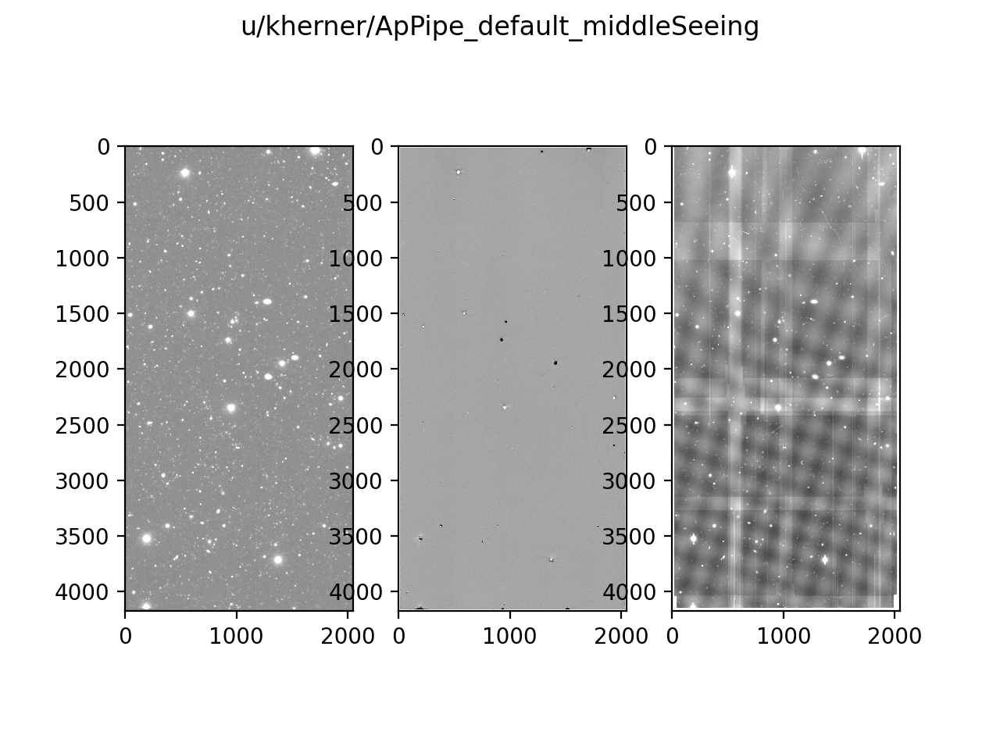

diffim variance median: 212.61234


<IPython.core.display.Javascript object>


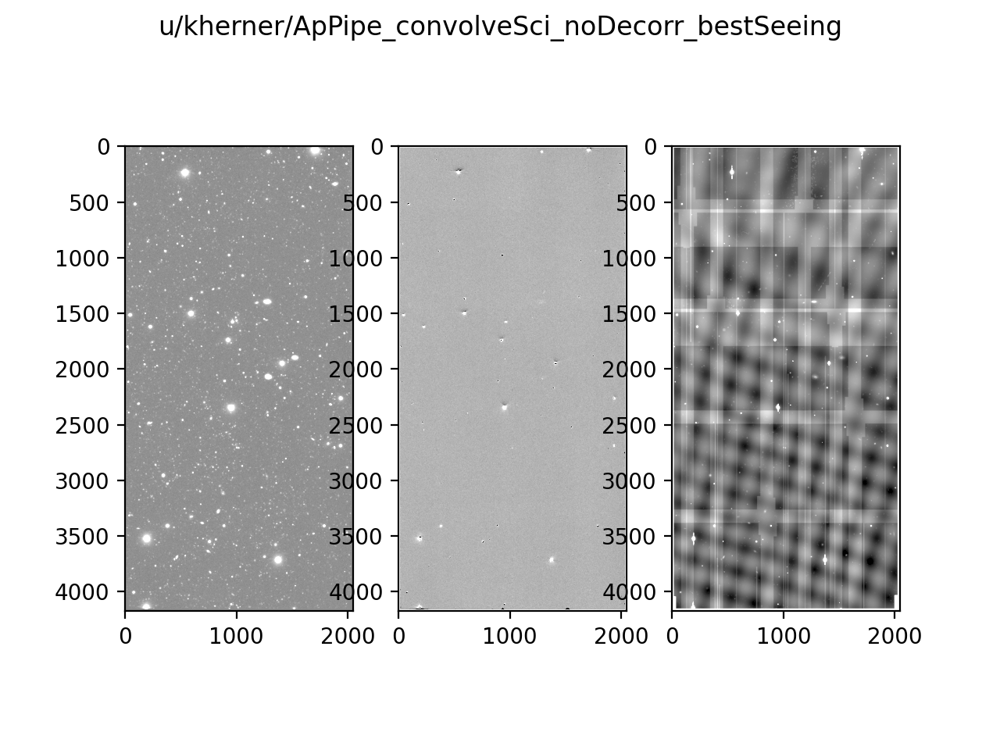

diffim variance median: 55.666286


<IPython.core.display.Javascript object>


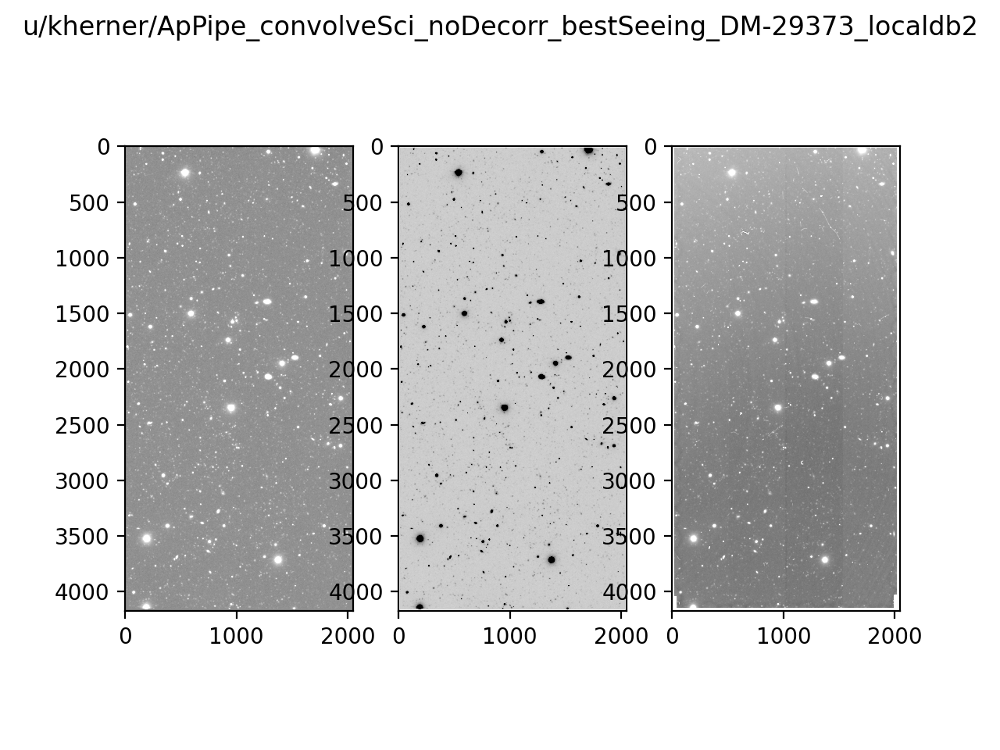

diffim variance median: 26890420.0


In [17]:
for run in all_runs:
    collection = run.collection
    calexp = butler.get('calexp', instrument='HSC',
                        visit=oneVisit, detector=oneDetector, collections=collection)
    diffim = butler.get('deepDiff_differenceExp', instrument='HSC',
                        visit=oneVisit, detector=oneDetector, collections=collection)

    calexpNorm = ImageNormalize(calexp.image.array, interval=ZScaleInterval(), stretch=SqrtStretch())
    diffimNorm = ImageNormalize(diffim.image.array, interval=ZScaleInterval(), stretch=SqrtStretch())
    diffimVarNorm = ImageNormalize(diffim.variance.array, interval=ZScaleInterval(), stretch=SqrtStretch())

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle(collection)
    ax1.imshow(calexp.image.array, cmap='gray', norm=calexpNorm)
    ax2.imshow(diffim.image.array, cmap='gray', norm=diffimNorm)
    ax3.imshow(diffim.variance.array, cmap='gray', norm=diffimVarNorm)
    
    print('diffim variance median:', np.median(diffim.variance.array))

u/kherner/ApPipe_default_middleSeeing /project/kherner/diffim_sprint_2021-02/bps_testing/bps_default_middle.db


<IPython.core.display.Javascript object>


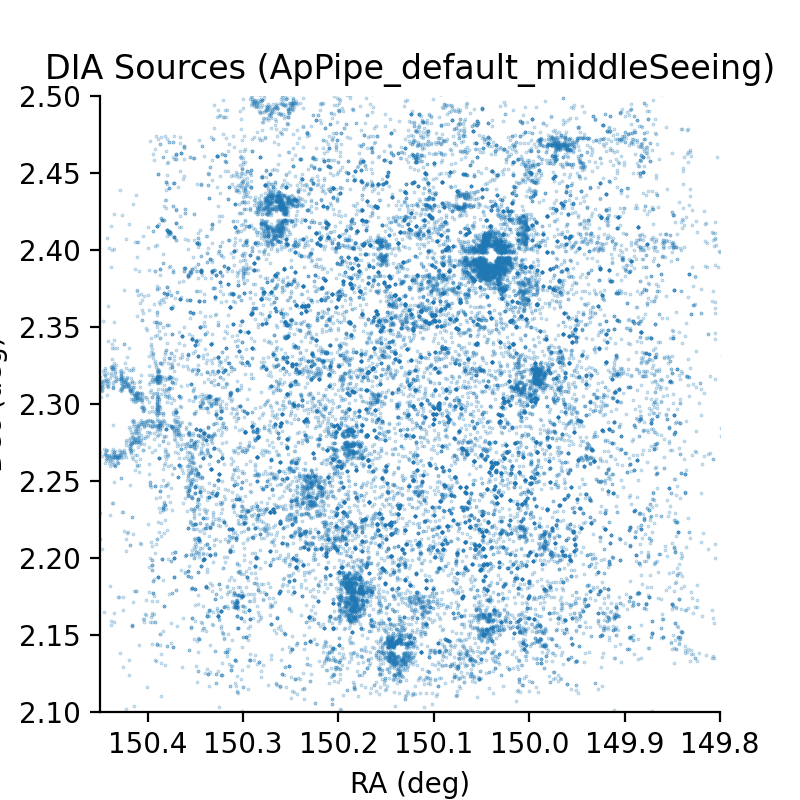

<IPython.core.display.Javascript object>


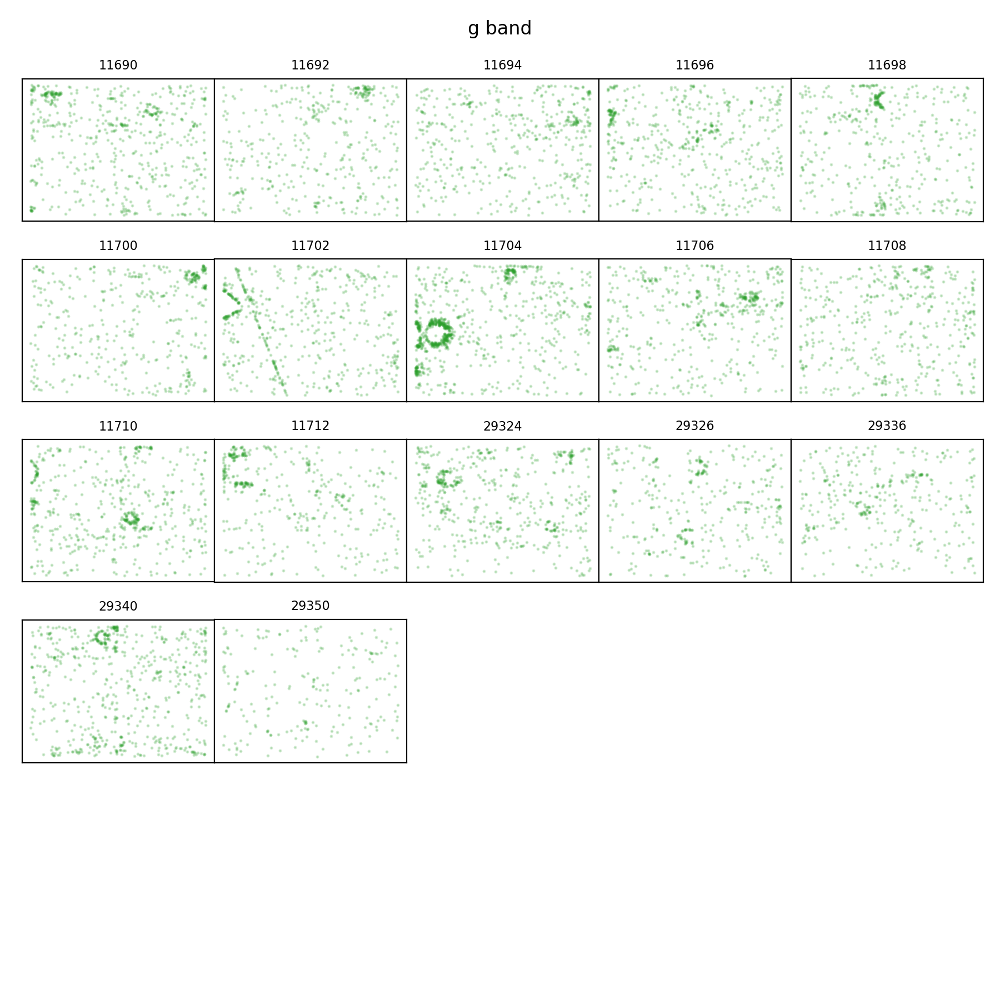

<IPython.core.display.Javascript object>


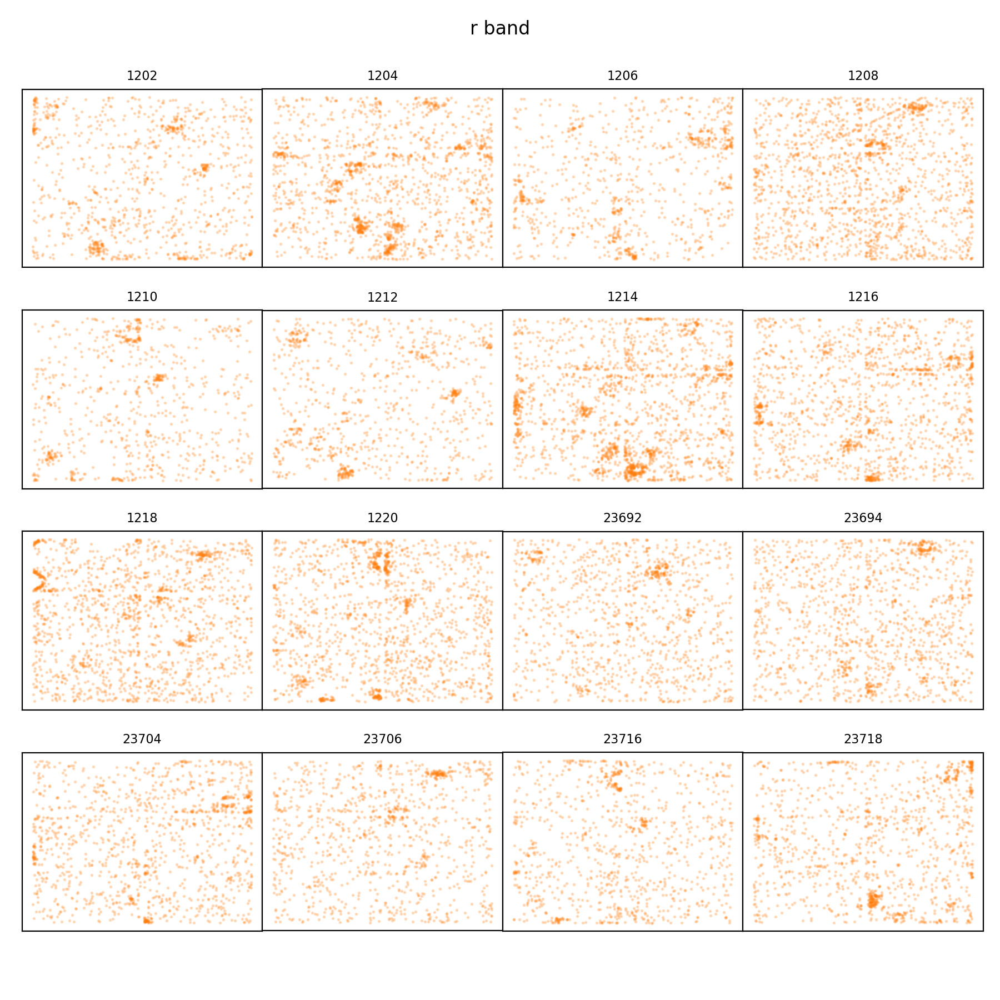

<IPython.core.display.Javascript object>


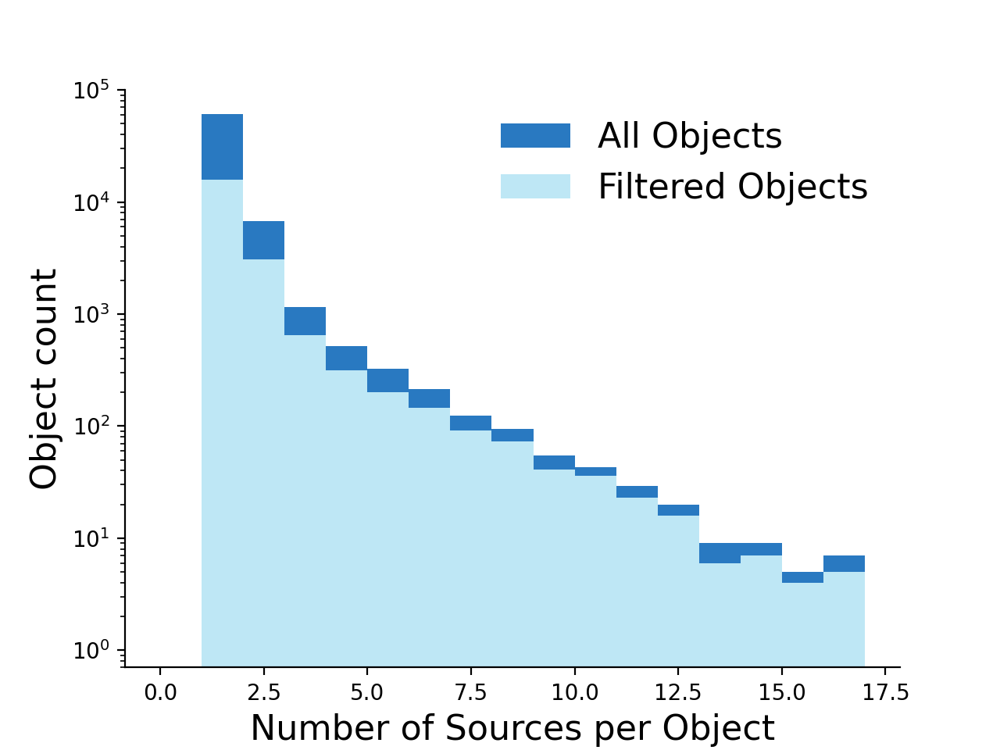

<IPython.core.display.Javascript object>


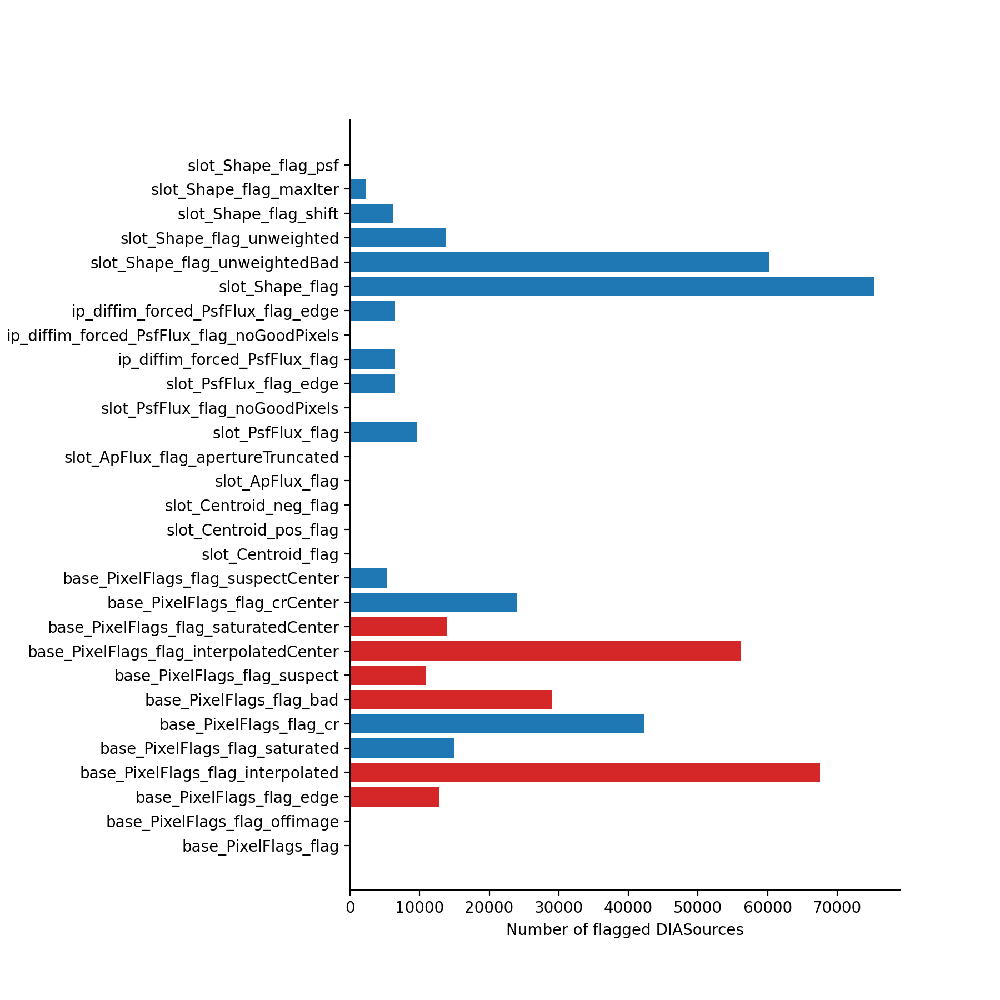

<IPython.core.display.Javascript object>


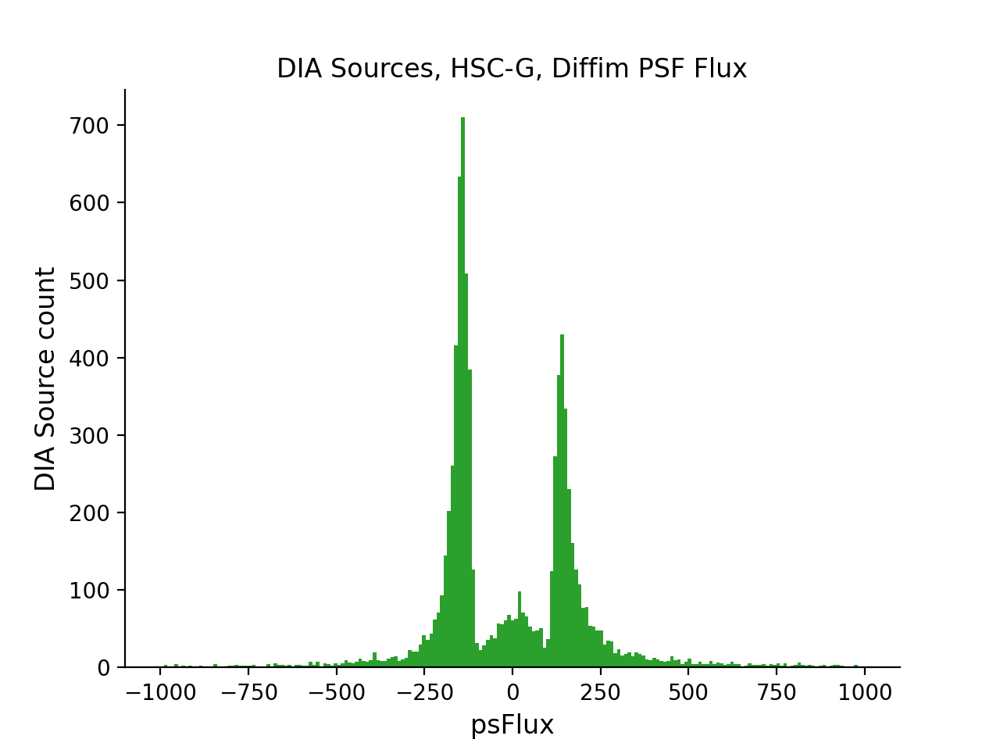

<IPython.core.display.Javascript object>


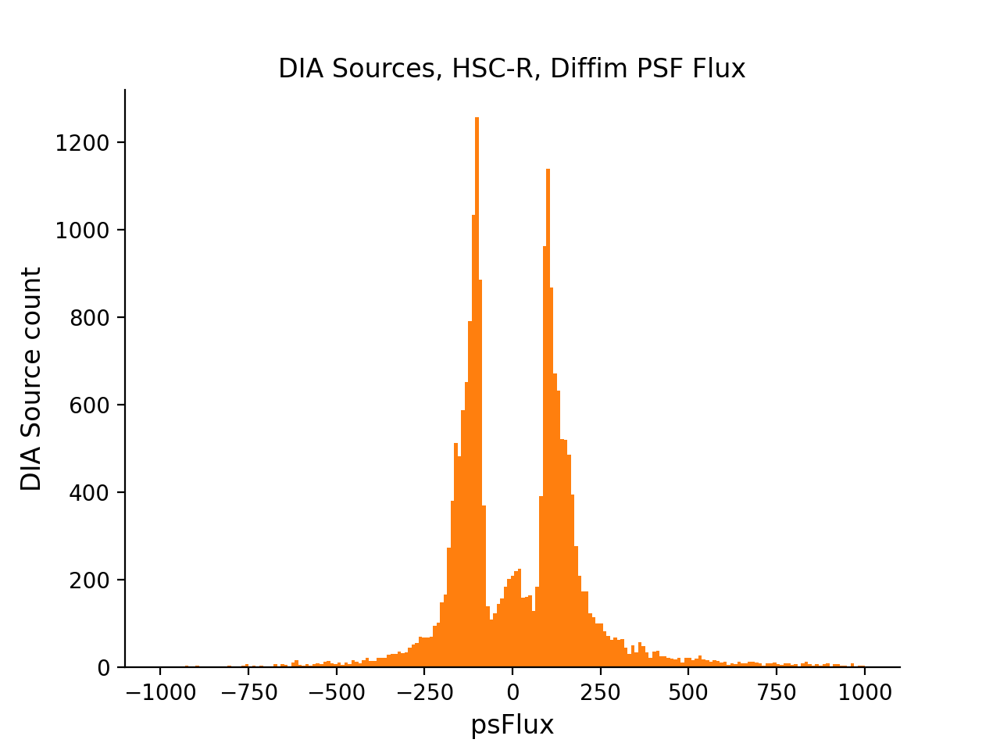

<IPython.core.display.Javascript object>


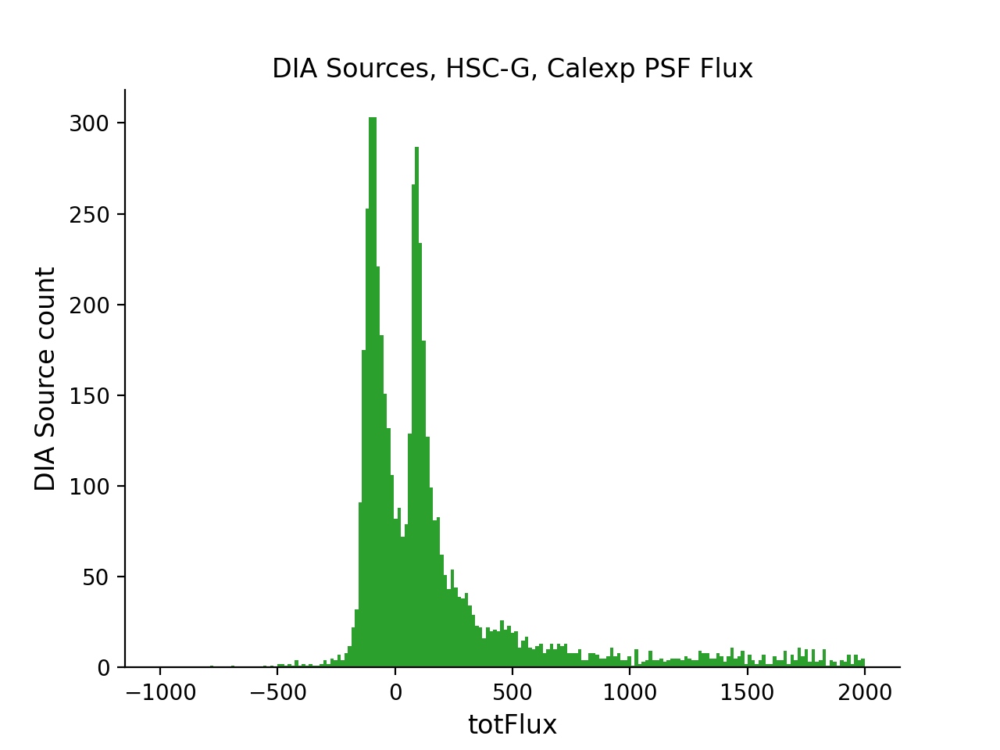

<IPython.core.display.Javascript object>


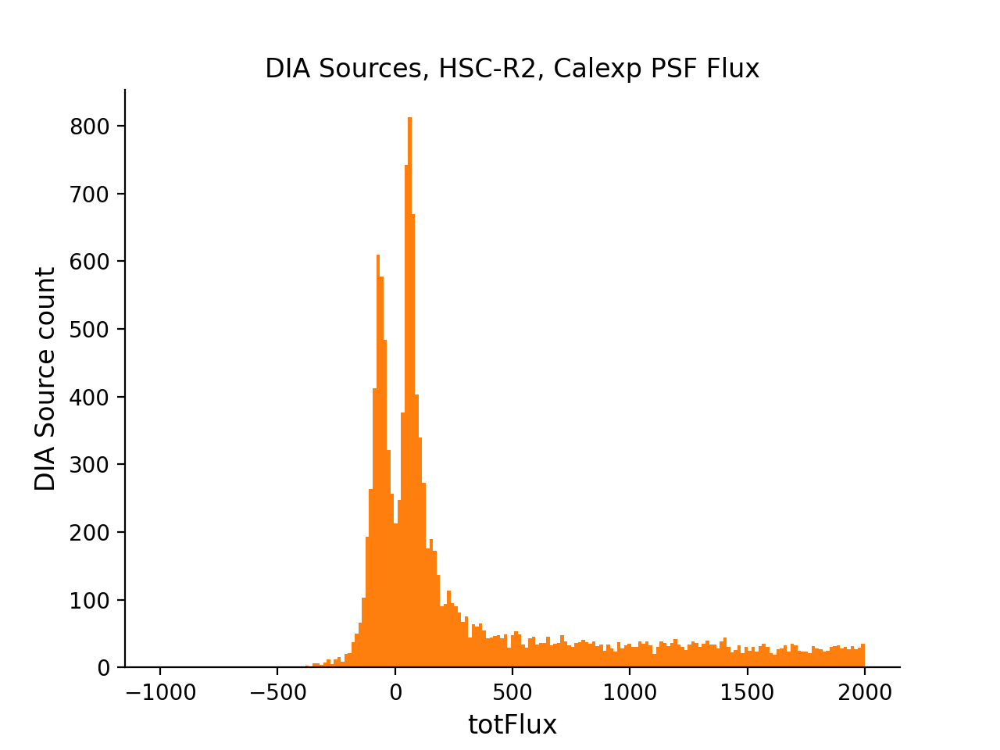

<IPython.core.display.Javascript object>


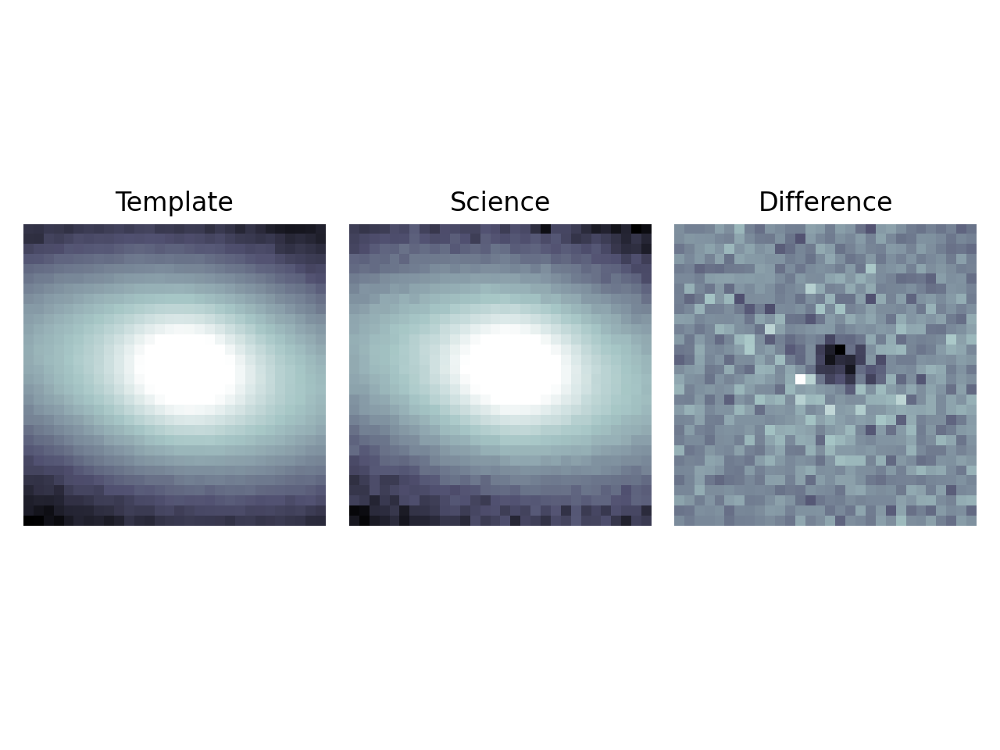

<IPython.core.display.Javascript object>


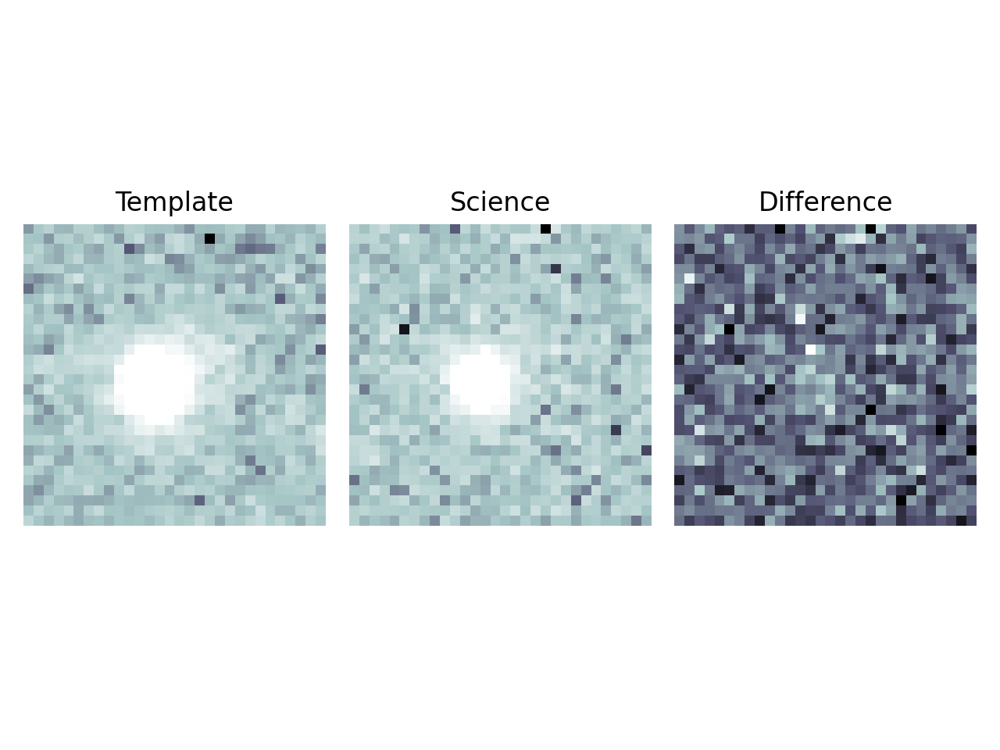

<IPython.core.display.Javascript object>


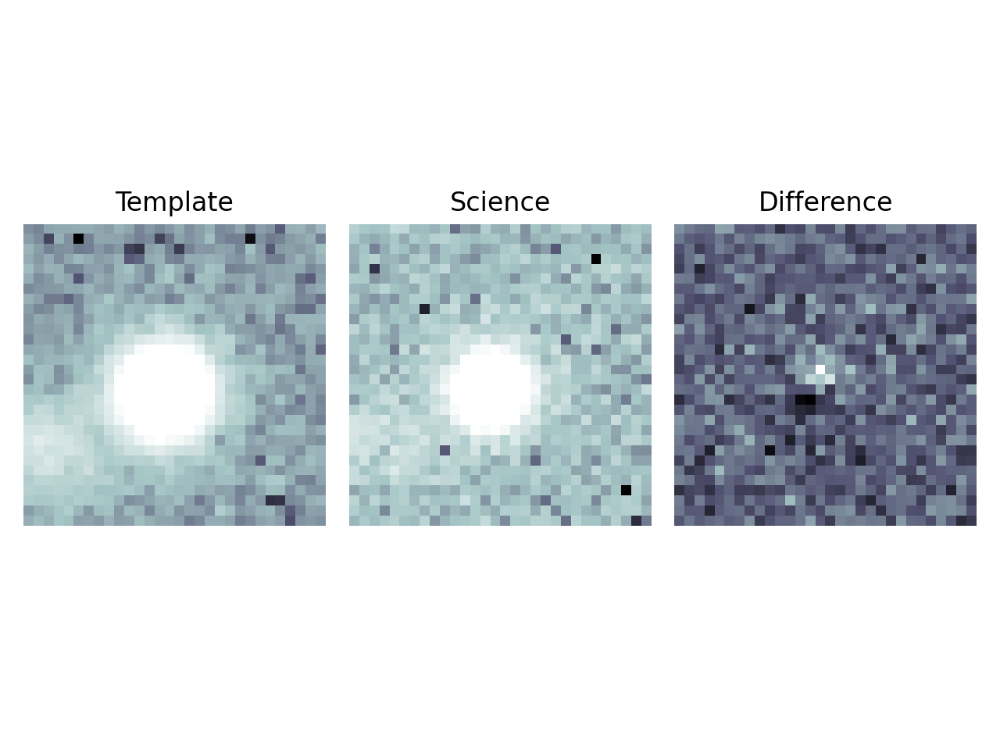

<IPython.core.display.Javascript object>


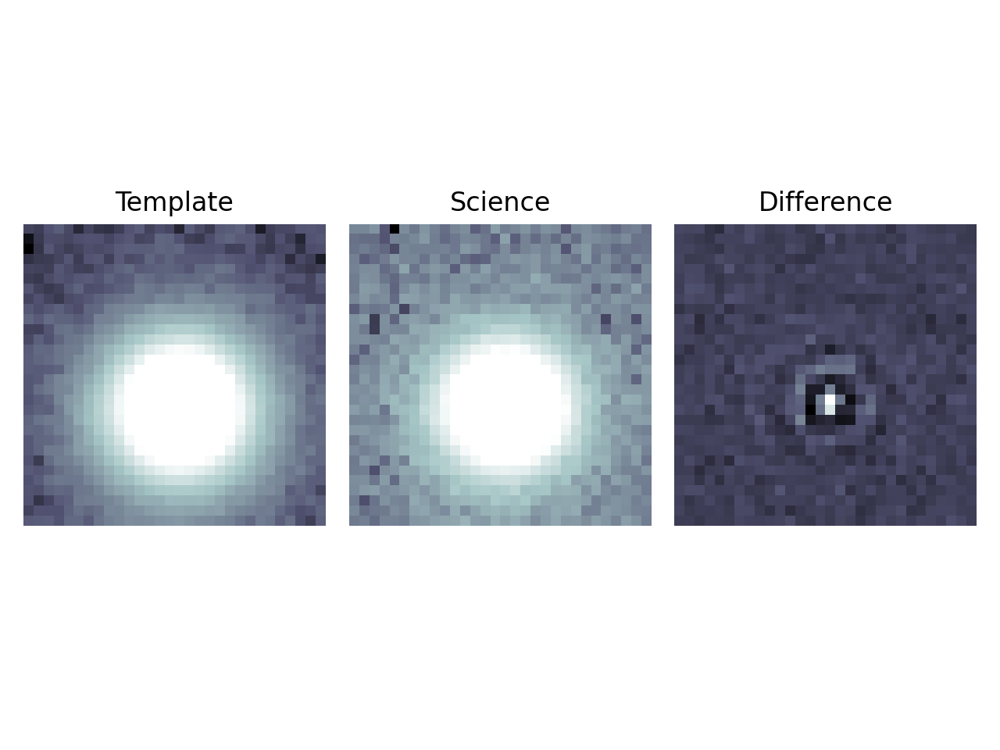

u/kherner/ApPipe_convolveSci_noDecorr_bestSeeing /project/kherner/diffim_sprint_2021-02/bps_testing/bps_convolveSci_noDecorr_best.db


<IPython.core.display.Javascript object>


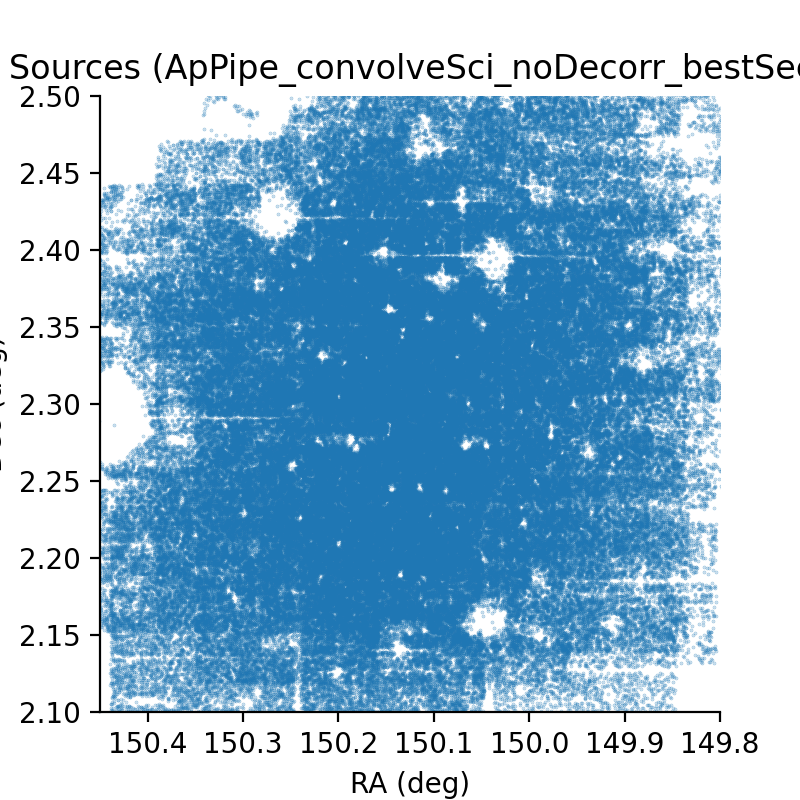

<IPython.core.display.Javascript object>


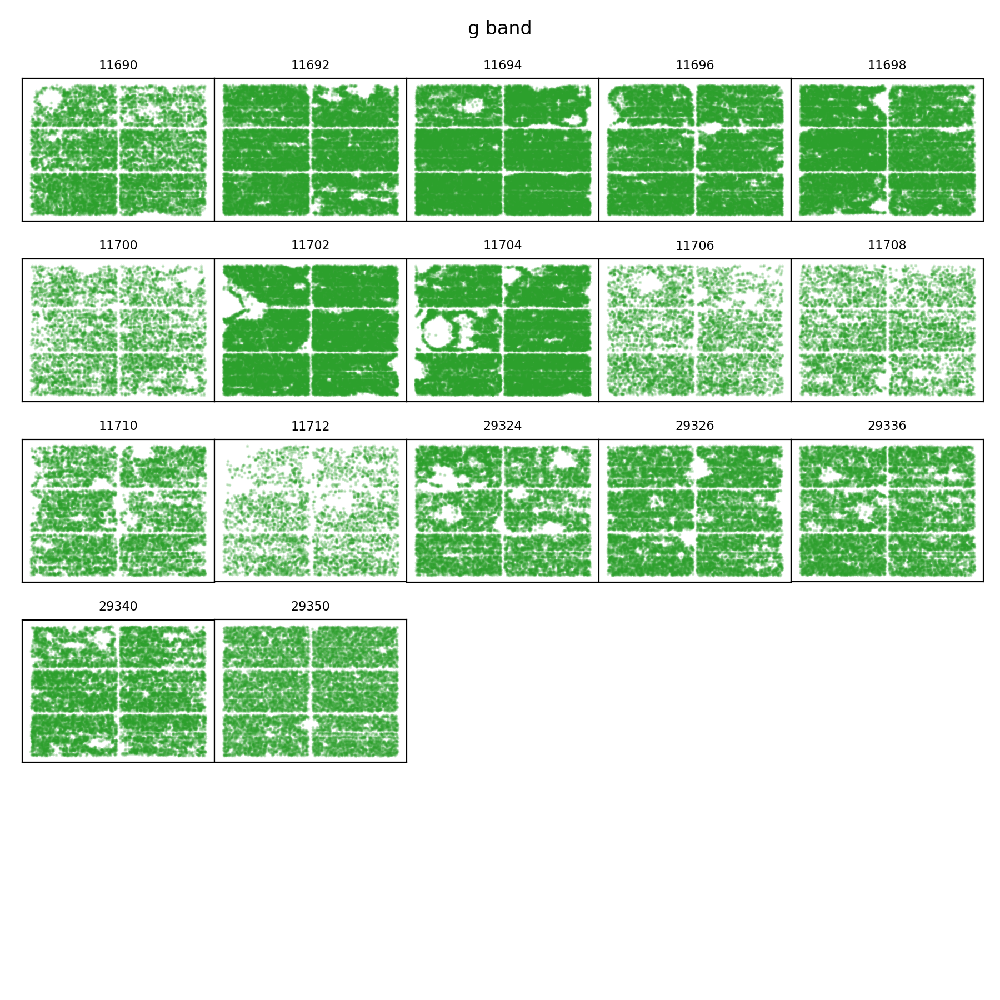

<IPython.core.display.Javascript object>


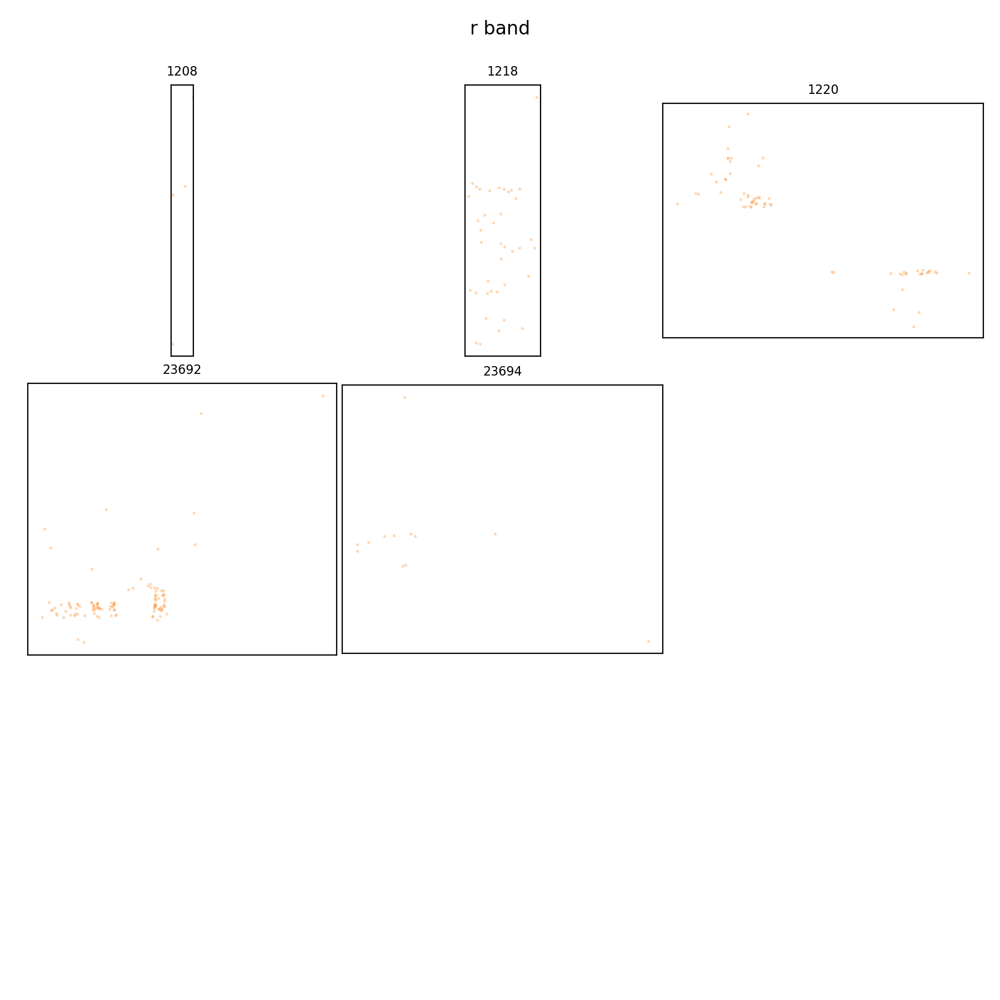

<IPython.core.display.Javascript object>


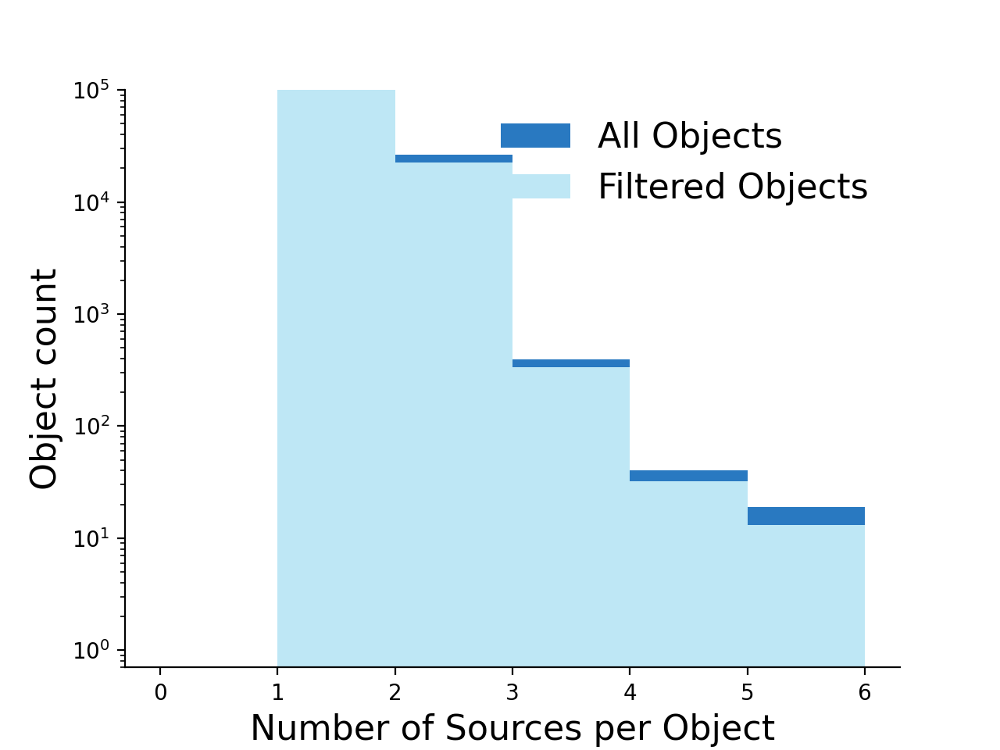

/project/mrawls/ap_pipe-notebooks/apdbPlots.py:811: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(9, 9))


<IPython.core.display.Javascript object>


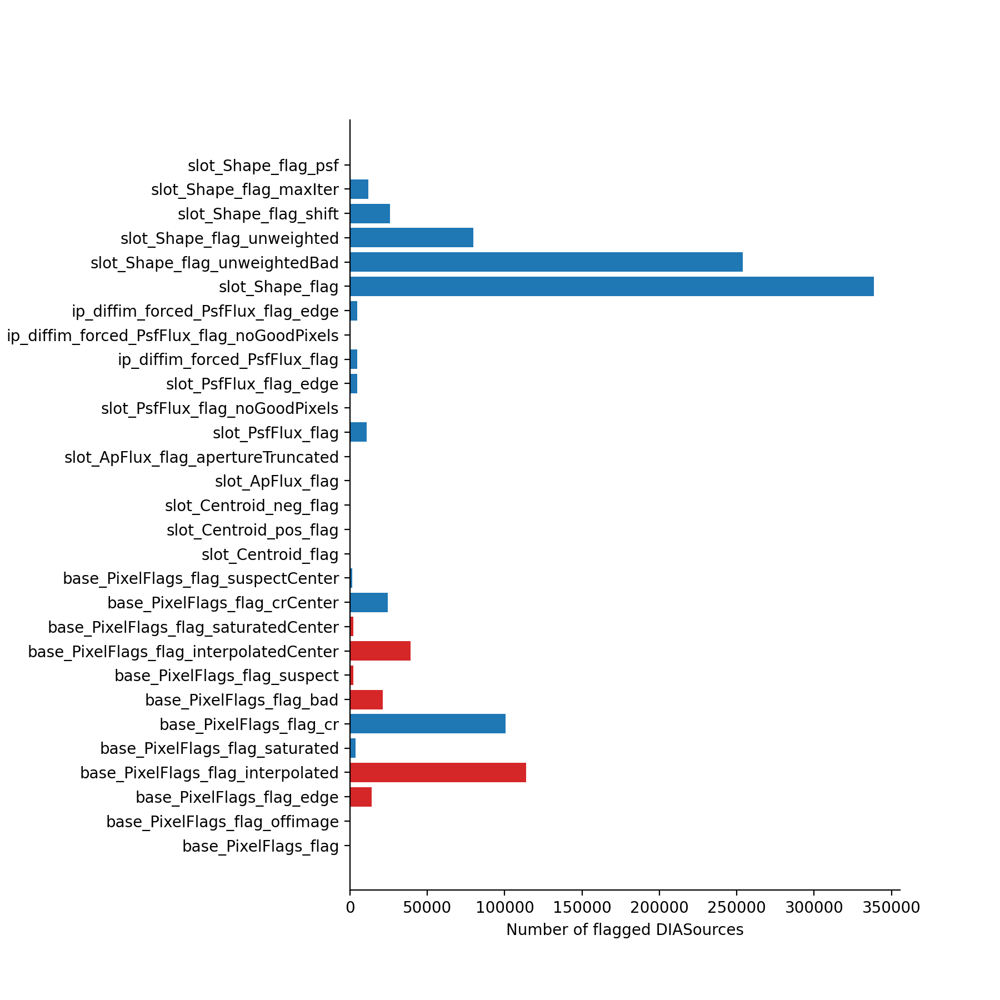

<IPython.core.display.Javascript object>


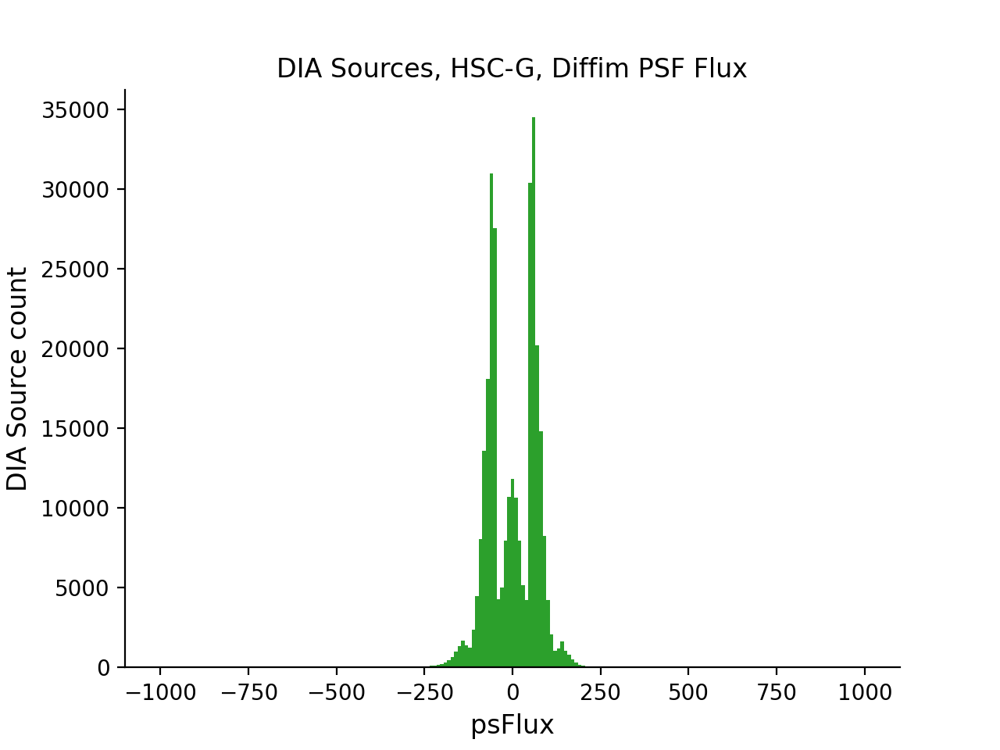

<IPython.core.display.Javascript object>


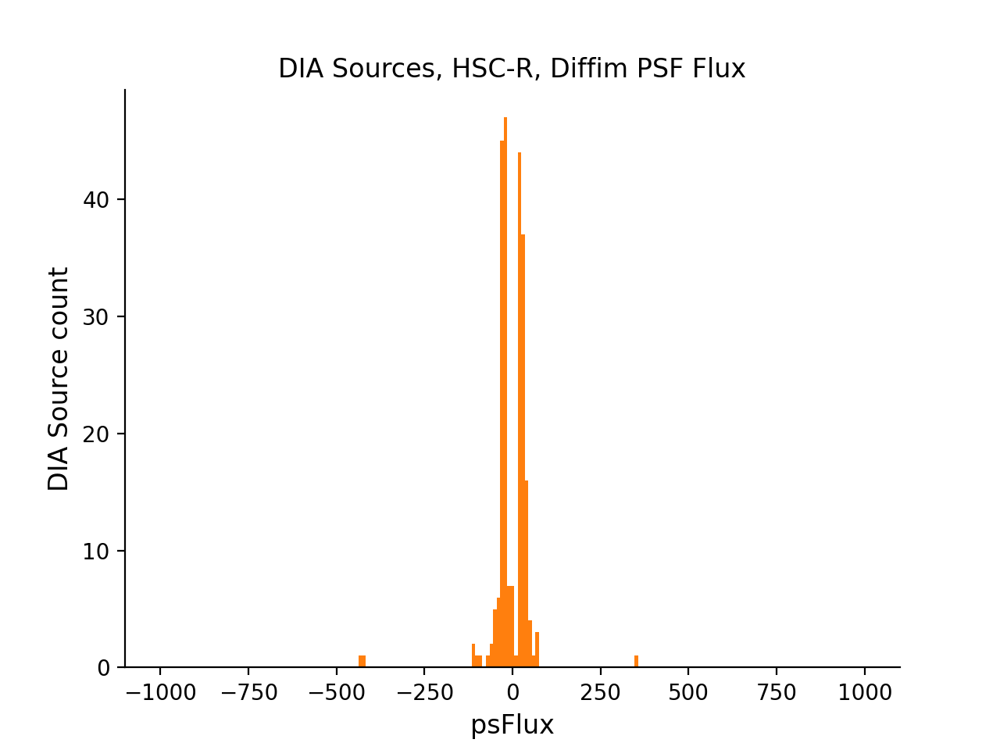

<IPython.core.display.Javascript object>


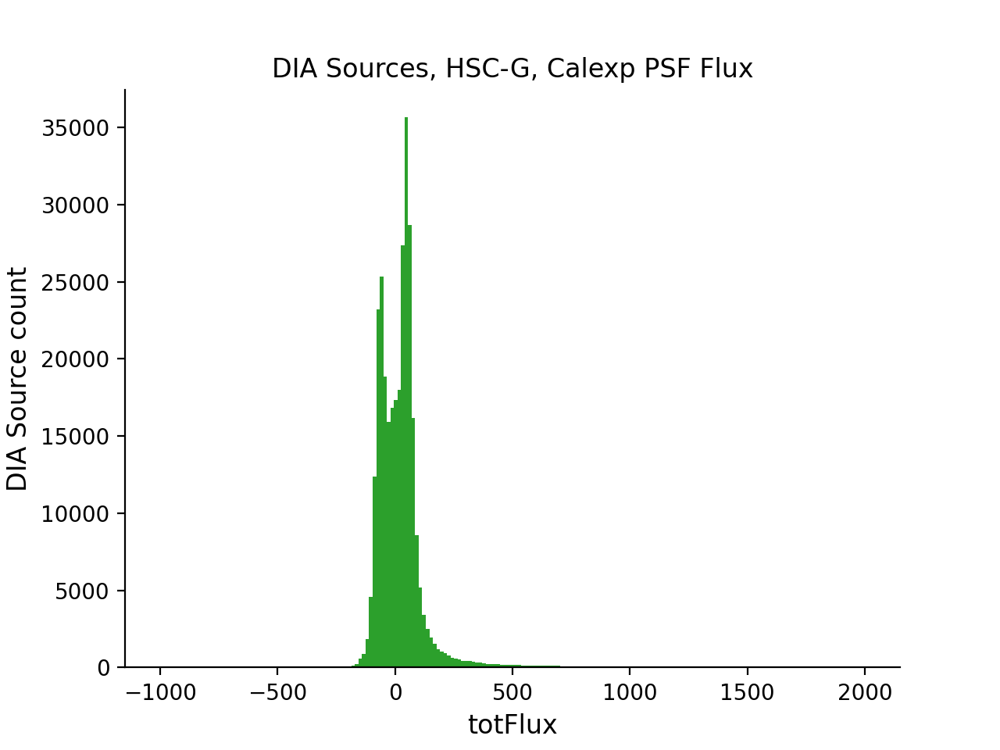

<IPython.core.display.Javascript object>


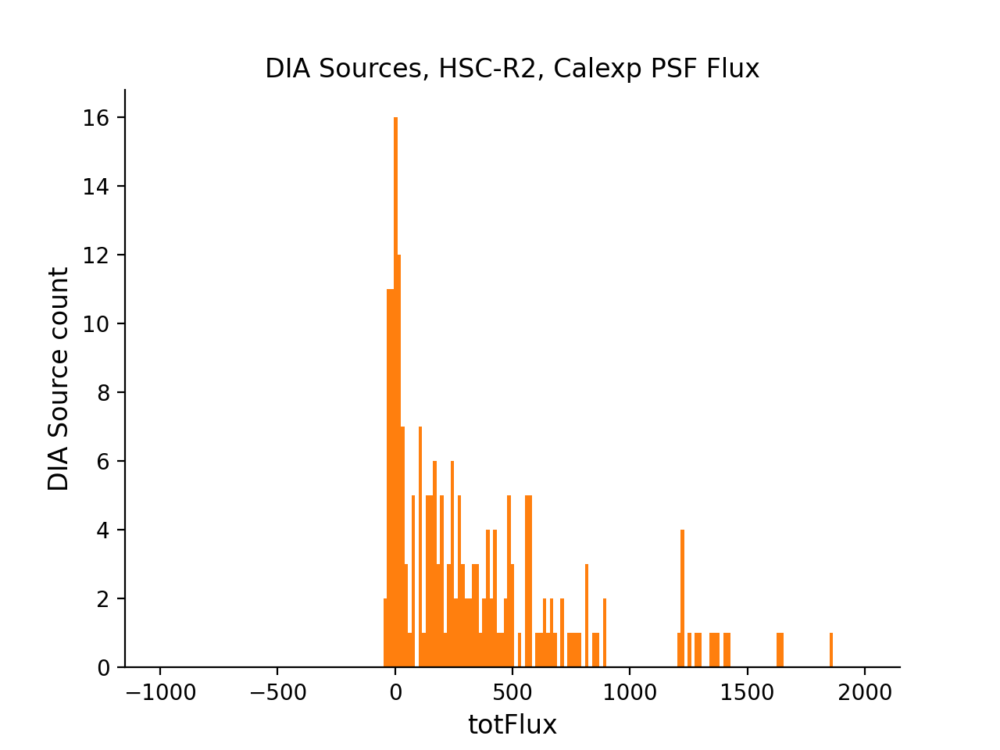

<IPython.core.display.Javascript object>


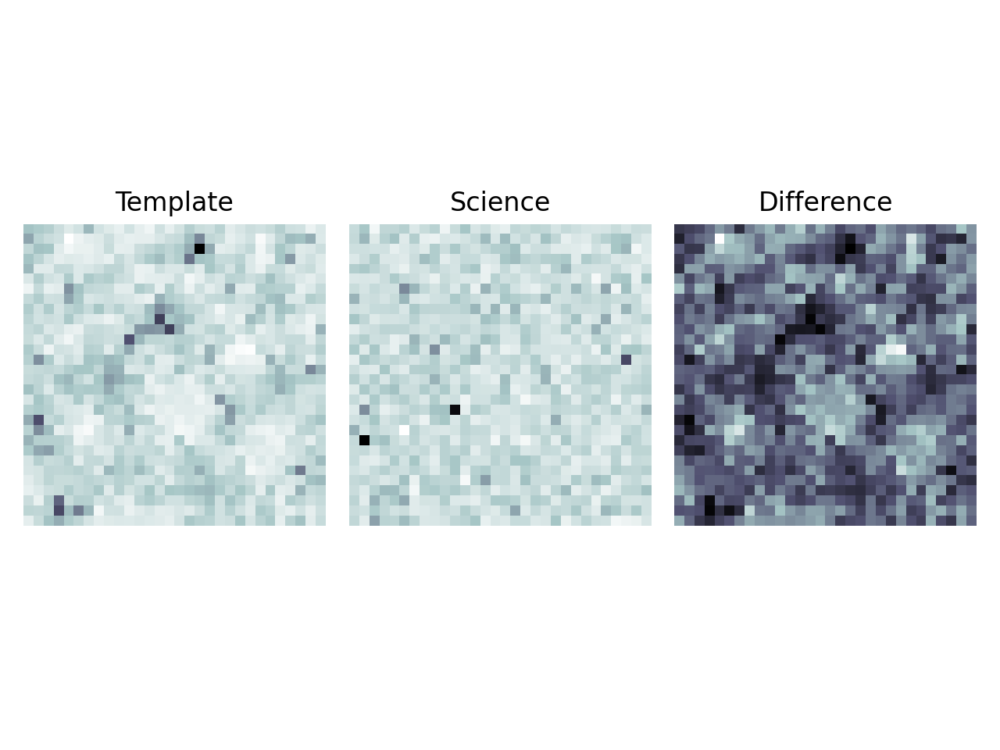

<IPython.core.display.Javascript object>


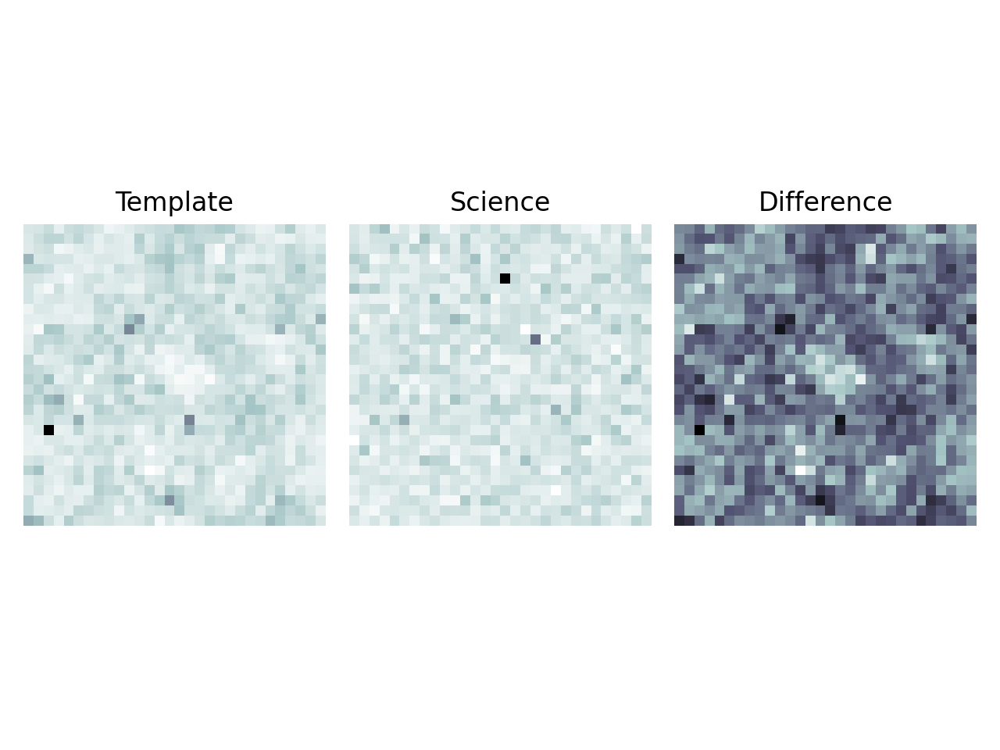

<IPython.core.display.Javascript object>


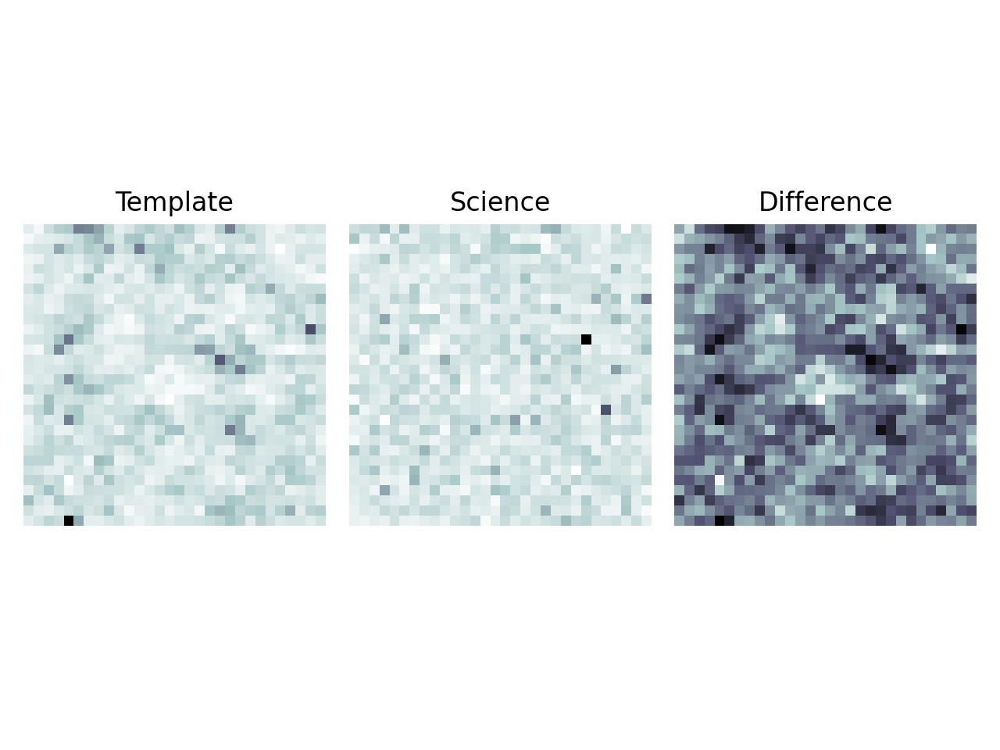

<IPython.core.display.Javascript object>


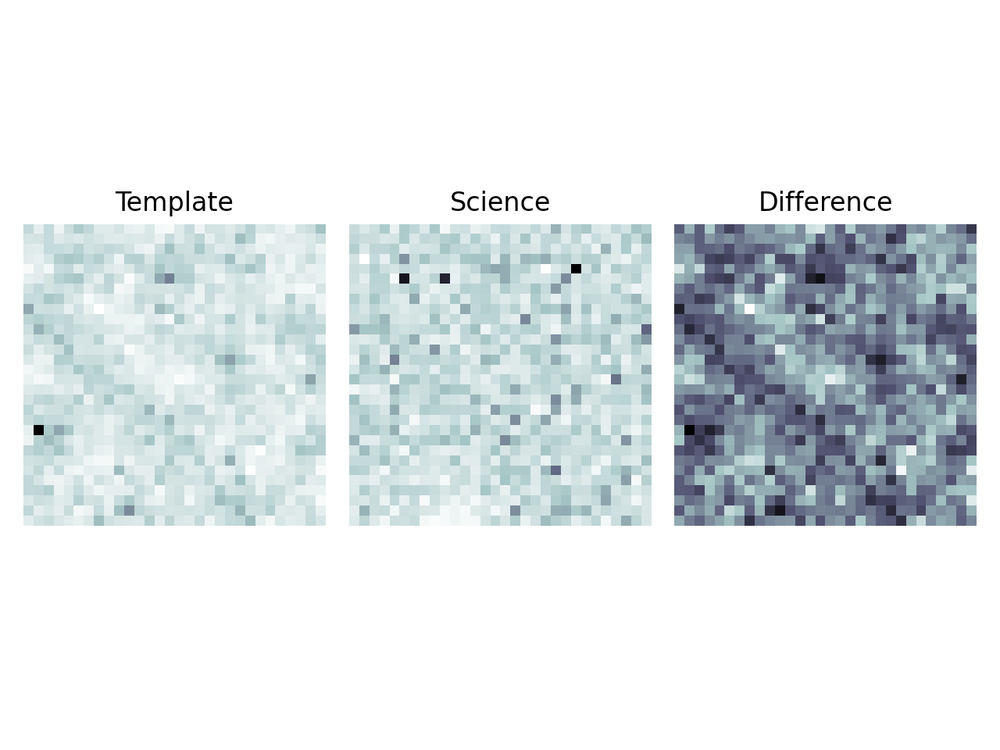

u/kherner/ApPipe_convolveSci_noDecorr_bestSeeing_DM-29373_localdb2 /project/kherner/diffim_sprint_2021-02/bps_testing/bps_convolveSci_noDecorr_debug.db


<IPython.core.display.Javascript object>


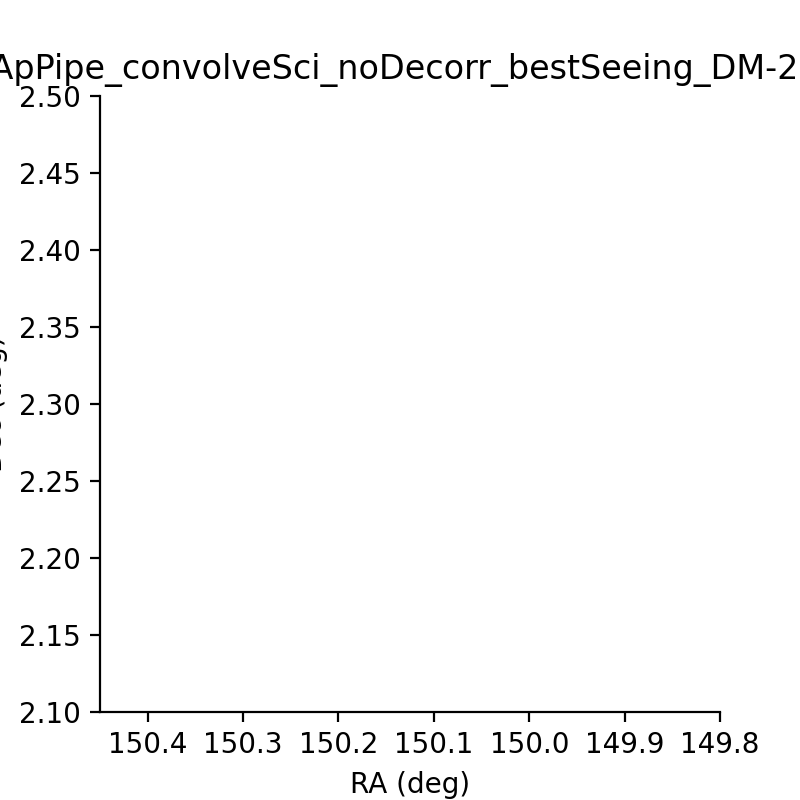

<IPython.core.display.Javascript object>


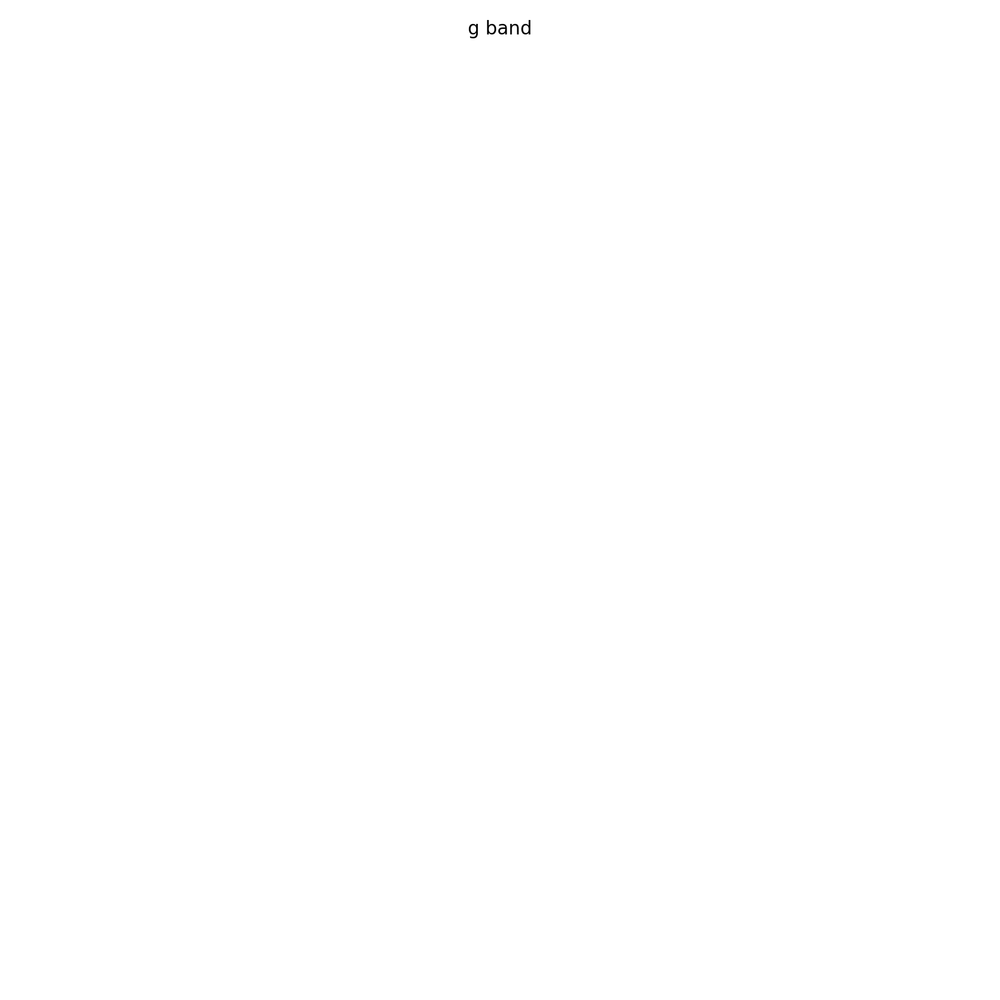

<IPython.core.display.Javascript object>


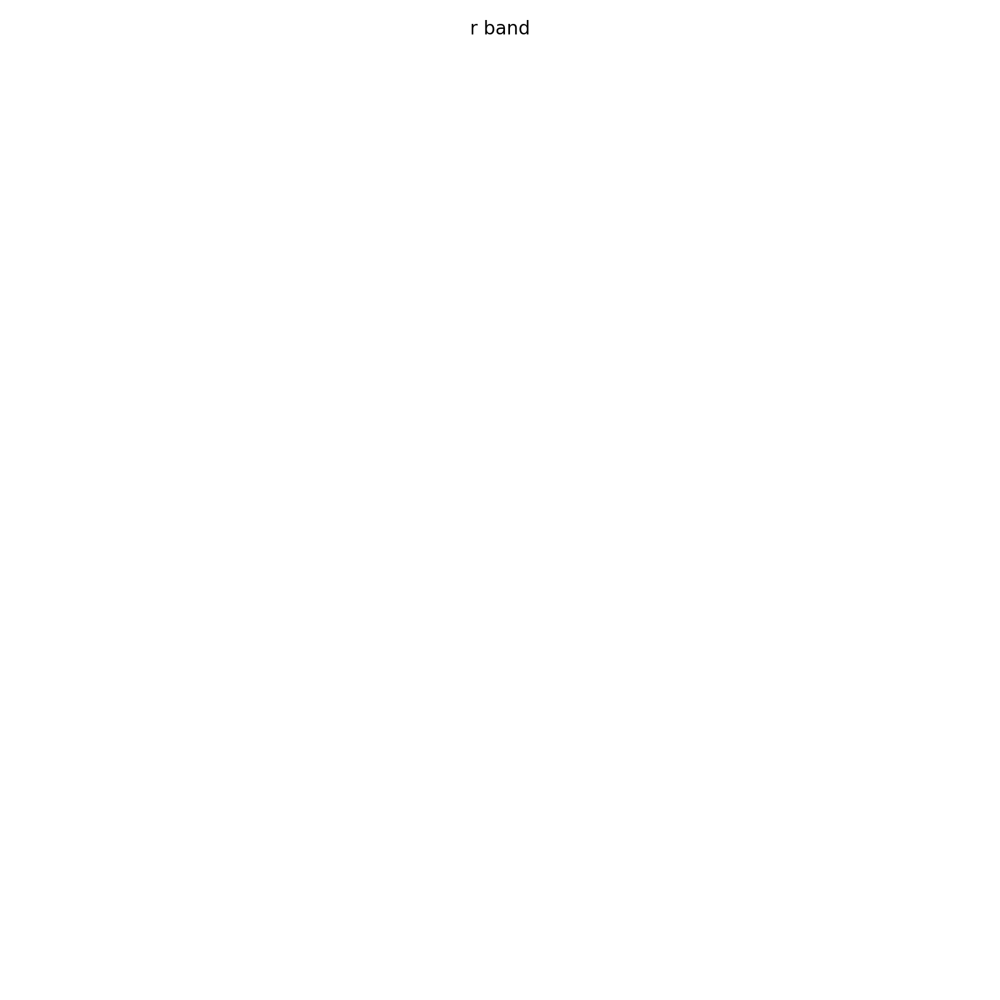

<IPython.core.display.Javascript object>


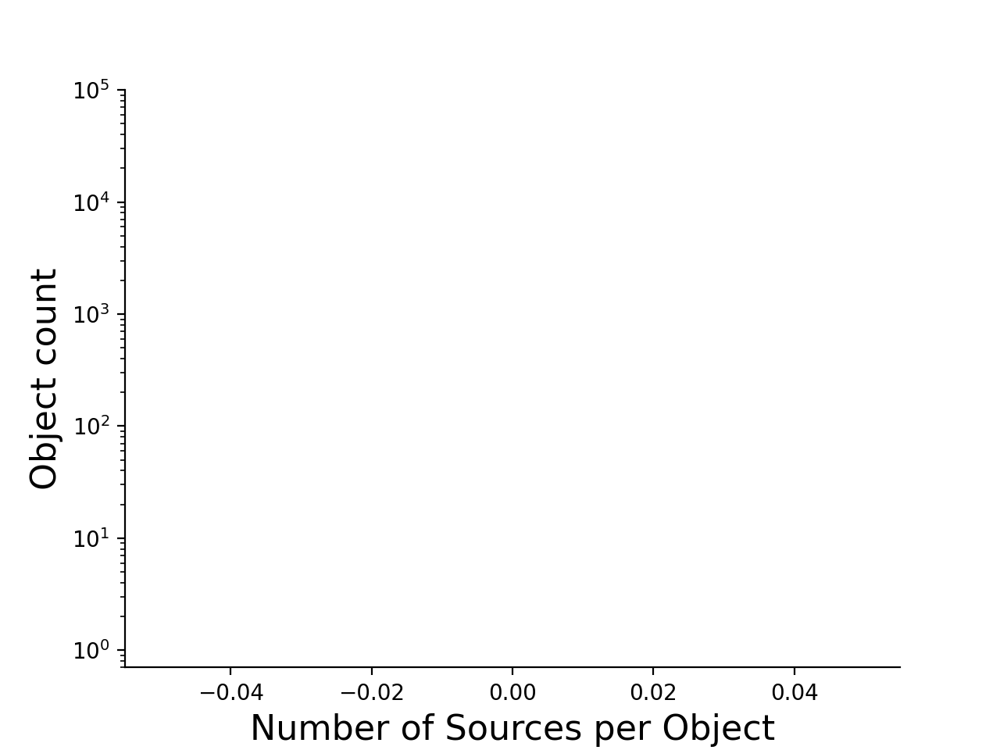

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


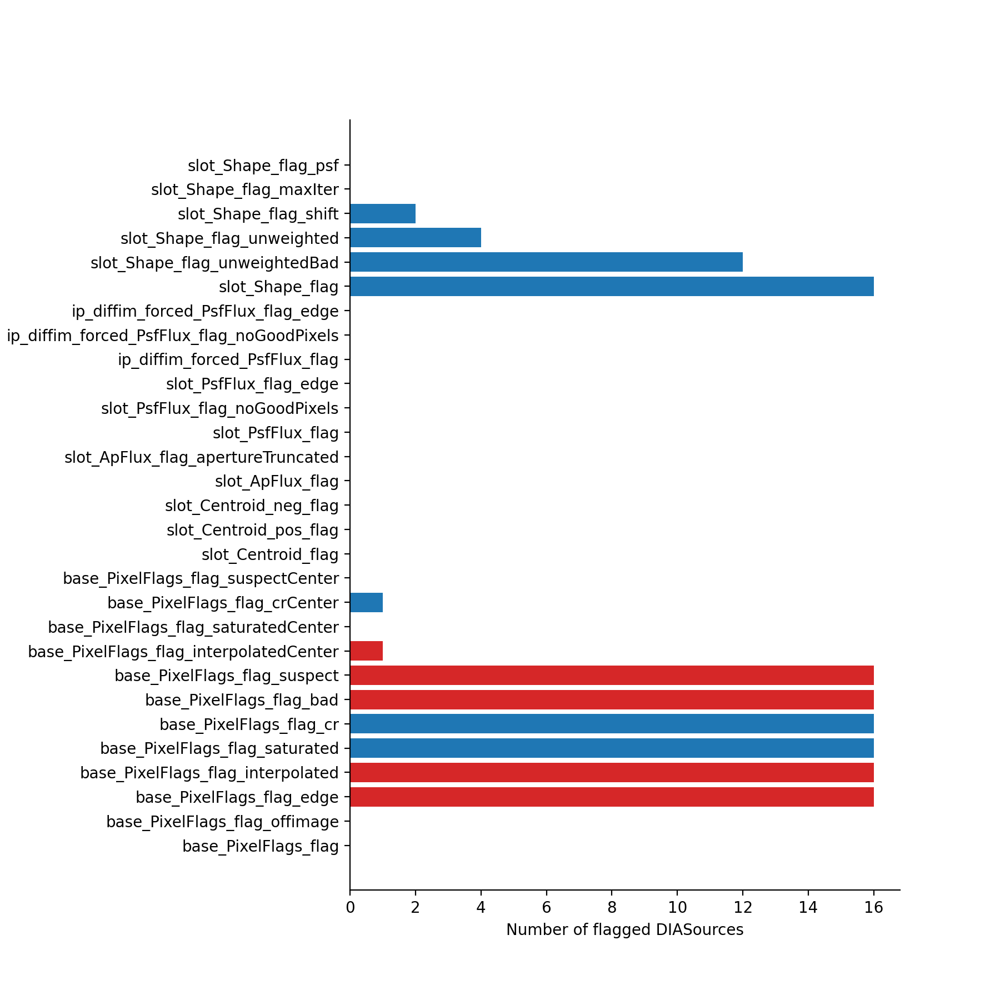

<IPython.core.display.Javascript object>


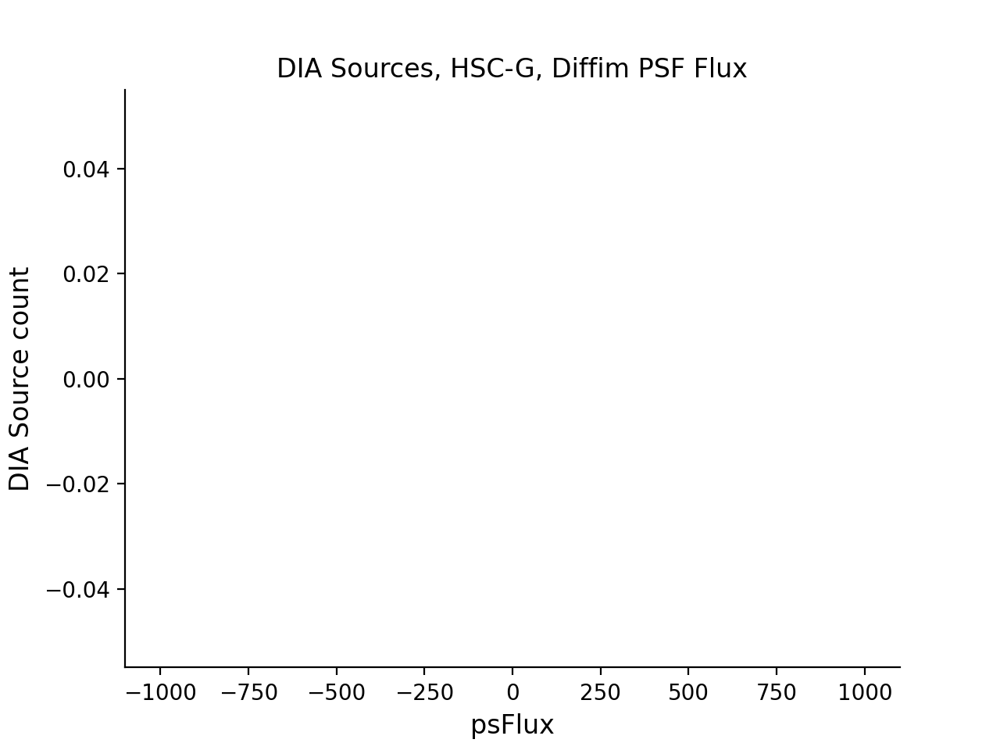

<IPython.core.display.Javascript object>


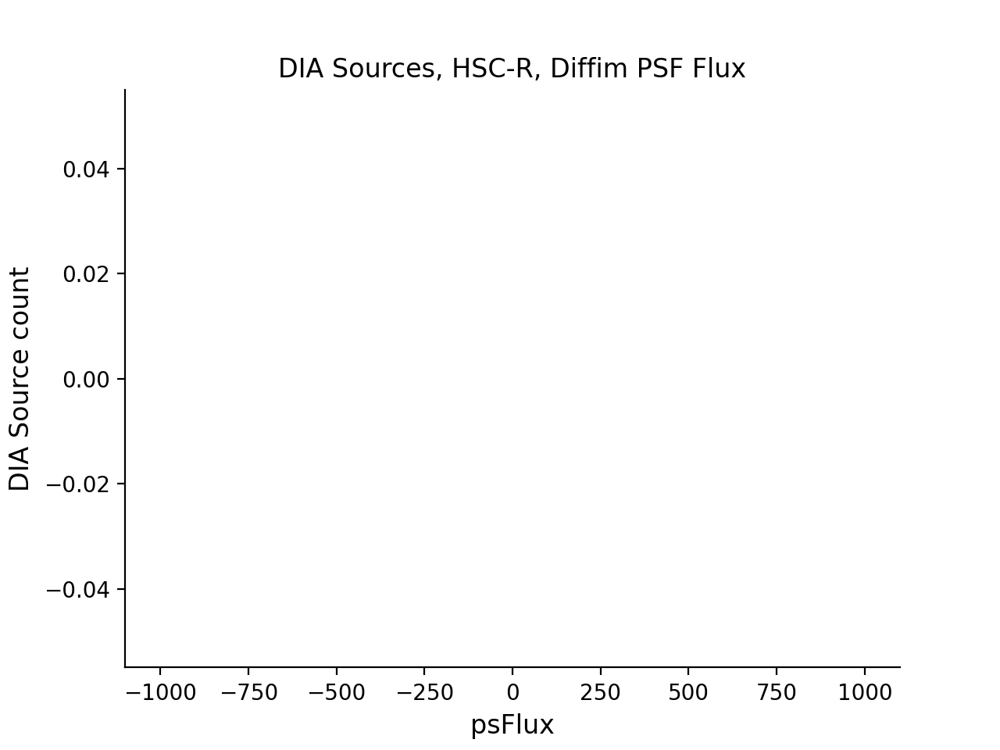

<IPython.core.display.Javascript object>


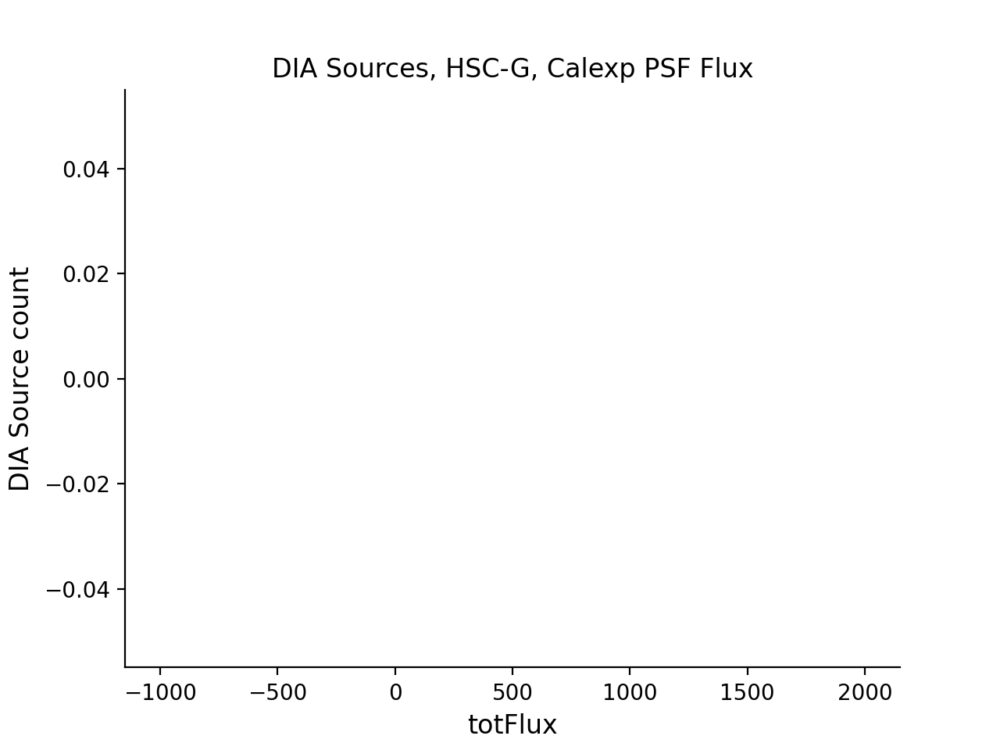

<IPython.core.display.Javascript object>


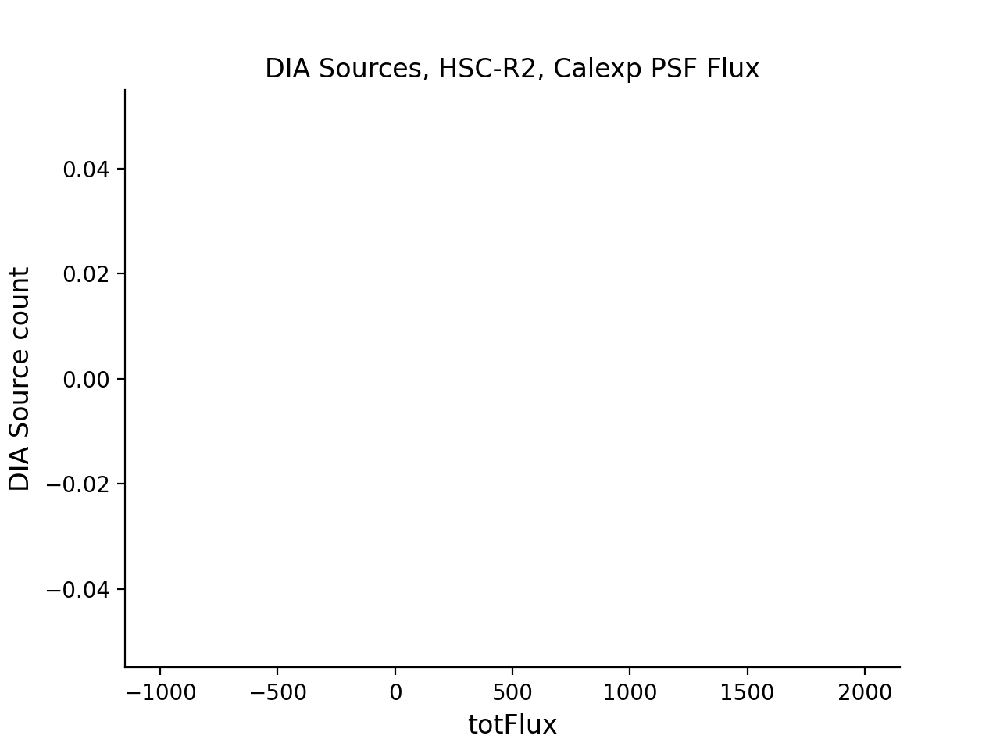

In [18]:
for run in all_runs:
    collection = run.collection
    apdb = run.apdb
    print(collection, apdb)
    dbPath = apdb
    objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo, dbType='sqlite', dbName=dbPath, gen='gen3',
                                                          instrument='HSC')
    srcTable = pla.addVisitCcdToSrcTable(srcTable, instrument='HSC', gen='gen3', butler=butler)
    flagTable, srcTableFlags, flagFilter, goodSrc, goodObj = pla.makeSrcTableFlags(srcTable, objTable,
                                                                                   badFlagList=badFlagList,
                                                                                   gen='gen3', instrument='HSC',
                                                                                   repo=repo)
    # Good DIA Sources
    fig = plt.figure(figsize=(4,4))
    xlim = (150.45, 149.8)
    ylim = (2.1, 2.5)
    ax = fig.add_subplot(111)
    plt.setp(ax, xlim=xlim, ylim=ylim)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.scatter(goodSrc['ra'], goodSrc['decl'], c='C0', s=0.1, marker='o', alpha=0.4)
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.set_title(f'DIA Sources ({str(collection).split("/")[-1]})')
    
    # Good DIA Sources by visit
    bandList = ['g', 'r']
    colorList = ['C2', 'C1']
    for band, color in zip(bandList, colorList):
        pla.plotDiaSourcesOnSkyGrid(repo, goodSrc.loc[goodSrc['filterName'] == band],
                                    title=band+' band', color=color, size=5)
    
    # How many DIA Sources comprise each DIA Object
    hist = doa.plotDiaObjectHistogram(objTable, goodObj)
    
    # Flag bar chart
    pla.plotFlagHist(srcTable, badFlagList=badFlagList)
    
    # Flux distributions
    pla.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'g'], fluxType='psFlux',
                        title='DIA Sources, HSC-G, Diffim PSF Flux', color1='C2', binmin=-1e3, binmax=1e3)
    pla.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'r'], fluxType='psFlux',
                        title='DIA Sources, HSC-R, Diffim PSF Flux', color1='C1', binmin=-1e3, binmax=1e3)
    pla.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'g'], fluxType='totFlux',
                        title='DIA Sources, HSC-G, Calexp PSF Flux', color1='C2', binmin=-1e3, binmax=2e3)
    pla.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'r'], fluxType='totFlux',
                        title='DIA Sources, HSC-R2, Calexp PSF Flux', color1='C1', binmin=-1e3, binmax=2e3)
    
    # Flux histograms
    #pla.source_magnitude_histogram(repo, goodSrc, 'g', 'HSC', collection)
    #pla.source_magnitude_histogram(repo, goodSrc, 'r', 'HSC', collection)
    
    # A few cutouts
    for index, source in goodSrc[:4].iterrows():
        dataId = {'detector': int(goodSrc['ccd'][index]), 'visit': int(goodSrc['visit'][index]), 'instrument': 'HSC'}
        center = lsst.geom.SpherePoint(goodSrc['ra'][index], goodSrc['decl'][index], lsst.geom.degrees)
        scienceCutout, differenceCutout, templateCutout = plc.retrieveCutouts(butler, dataId, collection, center)
        plc.plotCutout(scienceCutout, differenceCutout, templateCutout)